# 9. Advanced deep learning for computer vision

## 9.4 Interpreting what convnets learn

构建计算机视觉应用程序时的一个基本问题是可解释性：为什么您的分类器认为特定图像包含冰箱，而您只能看到一辆卡车？这对于使用深度学习来补充人类专业知识的用途特别相关，例如在医学成像用例中。在结束本章时，我们将让您熟悉一系列不同的技术，以可视化网络学习的内容并理解他们做出的决定。

人们常说，深度学习模型是“黑匣子”：它们学习难以提取和人类不可读的特征表示。虽然对于某些类型的深度学习模型来说，这部分是正确的，但对于convnets来说绝对不是这样。Convnets学到的表示非常适合可视化，这在很大程度上是因为它们是视觉概念的表示。自2013年以来，已经开发了广泛的技术来可视化和解释这些表征。我们不会全部调研，但我们会涵盖三个最容易访问和最有用的：

- **Visualizing intermediate convnet outputs (intermediate activations)** —— 适用于连续的convnet层如何转换其输入，以及初步了解单个convnet filter的含义
- **Visualizing convnet filters** —— 有助于准确了解convnet中的每个 filter 可以接受的视觉模式或概念
- **Visualizing heatmaps of class activation in an image** —— 有助于了解图像的哪些部分被识别为属于给定类，从而允许您在图像中定位对象

对于第一种方法—— activation visualization —— 我们将使用我们从头开始训练的关于第8.2节中狗对猫分类问题的小型convnet。对于接下来的两种方法，我们将使用预训练的Xception模型。

### 9.4.1 Visualizing intermediate activations

给定特定输入， 可视化中间激活包括显示模型中各种卷积层和池化层返回的值（层的输出通常称为其激活，即激活函数的输出）。这可以查看输入如何分解为网络学习的不同 filter。我们希望可视化三维特征图：宽度、高度和深度（通道）。每个通道编码相对独立的特征，因此可视化这些特征映射的正确方法是将每个通道的内容独立绘制为2D图像。让我们从加载您在第8.2节中保存的模型开始：



In [1]:
from tensorflow import keras
model = keras.models.load_model("convnet_from_scratch_with_augmentation.keras")
model.summary()

Metal device set to: Apple M1


2022-04-07 15:19:05.230288: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-04-07 15:19:05.230708: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 180, 180, 3)]     0         
_________________________________________________________________
sequential_5 (Sequential)    (None, 180, 180, 3)       0         
_________________________________________________________________
rescaling_1 (Rescaling)      (None, 180, 180, 3)       0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 178, 178, 32)      896       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 89, 89, 32)        0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 87, 87, 64)        18496     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 43, 43, 64)        0   

接下来，我们将获得一张输入图像——一张猫的照片，不是参与网络训练的图像。

In [3]:
from tensorflow import keras
import numpy as np

img_path = keras.utils.get_file(
    fname="cat.jpg",
    origin="https://img-datasets.s3.amazonaws.com/cat.jpg")

def get_img_array(img_path, target_size): 
    img = keras.utils.load_img(img_path, target_size=target_size) 
    array = keras.utils.img_to_array(img) 
    array = np.expand_dims(array, axis=0)
    return array

img_tensor = get_img_array(img_path, target_size=(180, 180))

90112/80329 [=================================] - 1s 6us/step


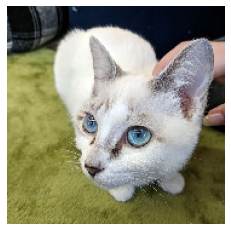

In [4]:
import matplotlib.pyplot as plt 
plt.axis("off") 
plt.imshow(img_tensor[0].astype("uint8")) 
plt.show()

为了提取我们要查看的特征映射，我们将创建一个Keras模型，该模型以批量图像作为输入，并输出所有卷积和池化层的激活。

In [5]:
from tensorflow.keras import layers
layer_outputs = [] 
layer_names = []
for layer in model.layers:
    if isinstance(layer, (layers.Conv2D, layers.MaxPooling2D)):
        layer_outputs.append(layer.output) 
        layer_names.append(layer.name)
activation_model = keras.Model(inputs=model.input, outputs=layer_outputs)

当输入图像时，该模型将原始模型中的层激活值作为列表返回。自从您在第7章中了解多输出模型以来，这是您第一次在实践中在本书中遇到多输出模型；到目前为止，您看到的模型只有一个输入和一个输出。这个有一个输入和九个输出：每层激活一个输出。

In [6]:
activations = activation_model.predict(img_tensor)

2022-04-07 16:09:43.822101: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2022-04-07 16:09:43.825368: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-04-07 16:09:43.881461: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


例如，这是猫图像输入的第一个卷积层的激活：

In [8]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 178, 178, 32)


这是一张178×178的特征图，有32个通道。让我们尝试绘制第 1 个通道。 

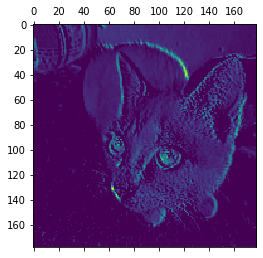

In [12]:
import matplotlib.pyplot as plt 
plt.matshow(first_layer_activation[0, :, :, 1], cmap="viridis")

此通道似乎编码对角线边缘检测器——但请注意，您自己的通道可能会有所不同，因为卷积层学到的特定过滤器不是确定的。

现在，让我们绘制网络中所有激活的完整可视化（见图9.14）。我们将提取和绘制每个层激活中的每个通道，并将结果堆叠到一个大网格中，通道并排堆叠。

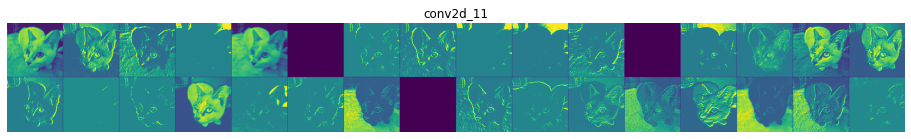

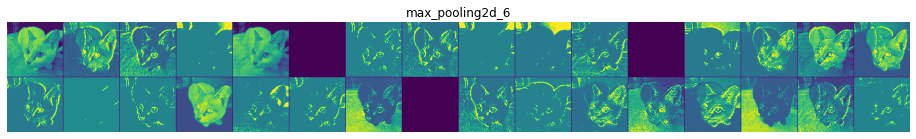

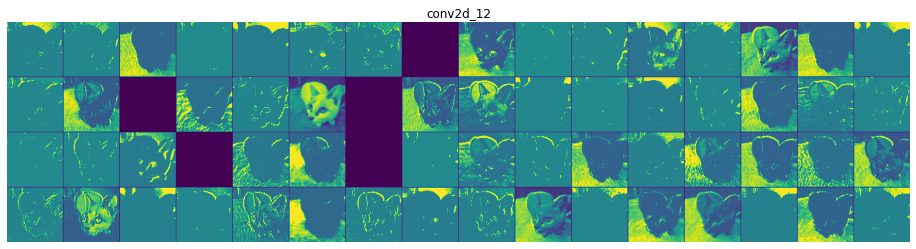

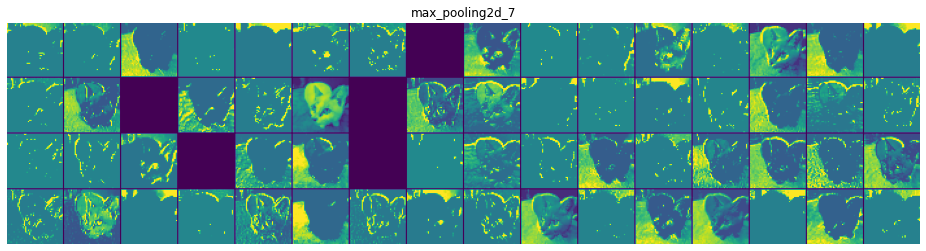

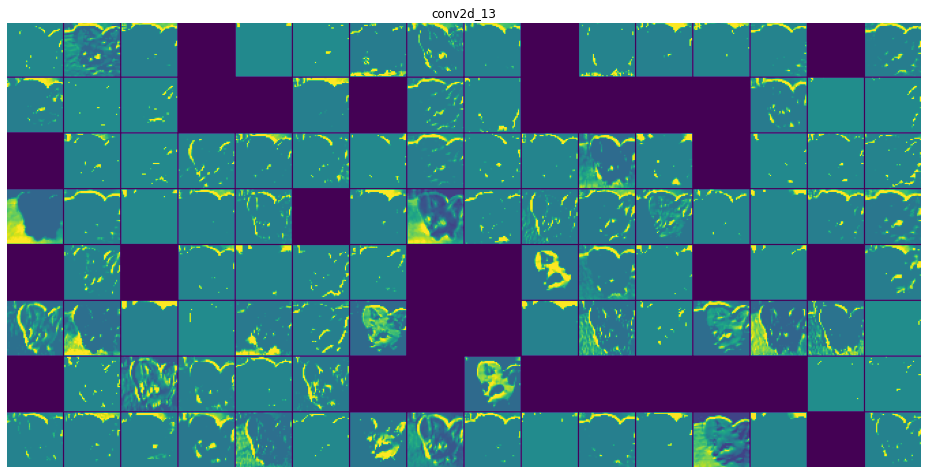

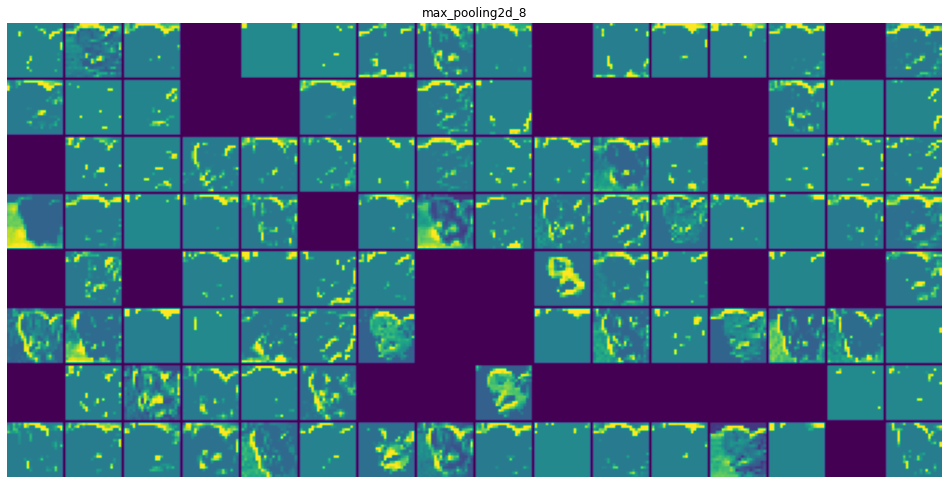

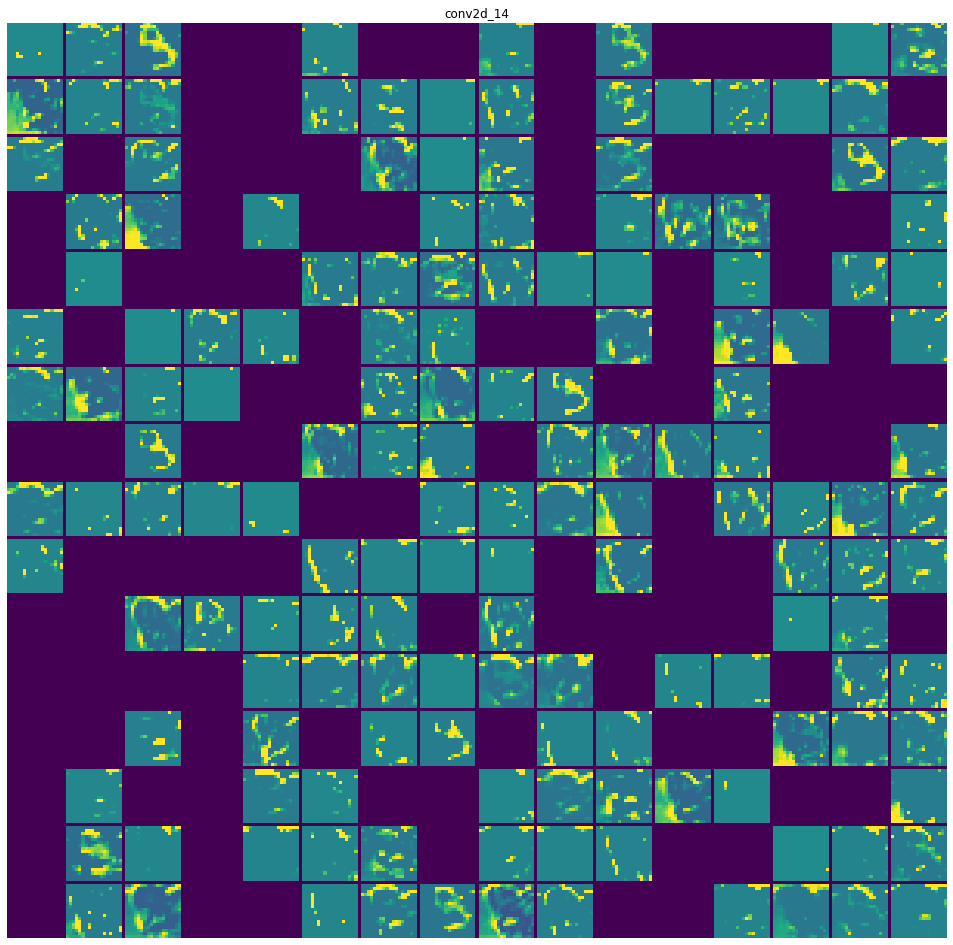

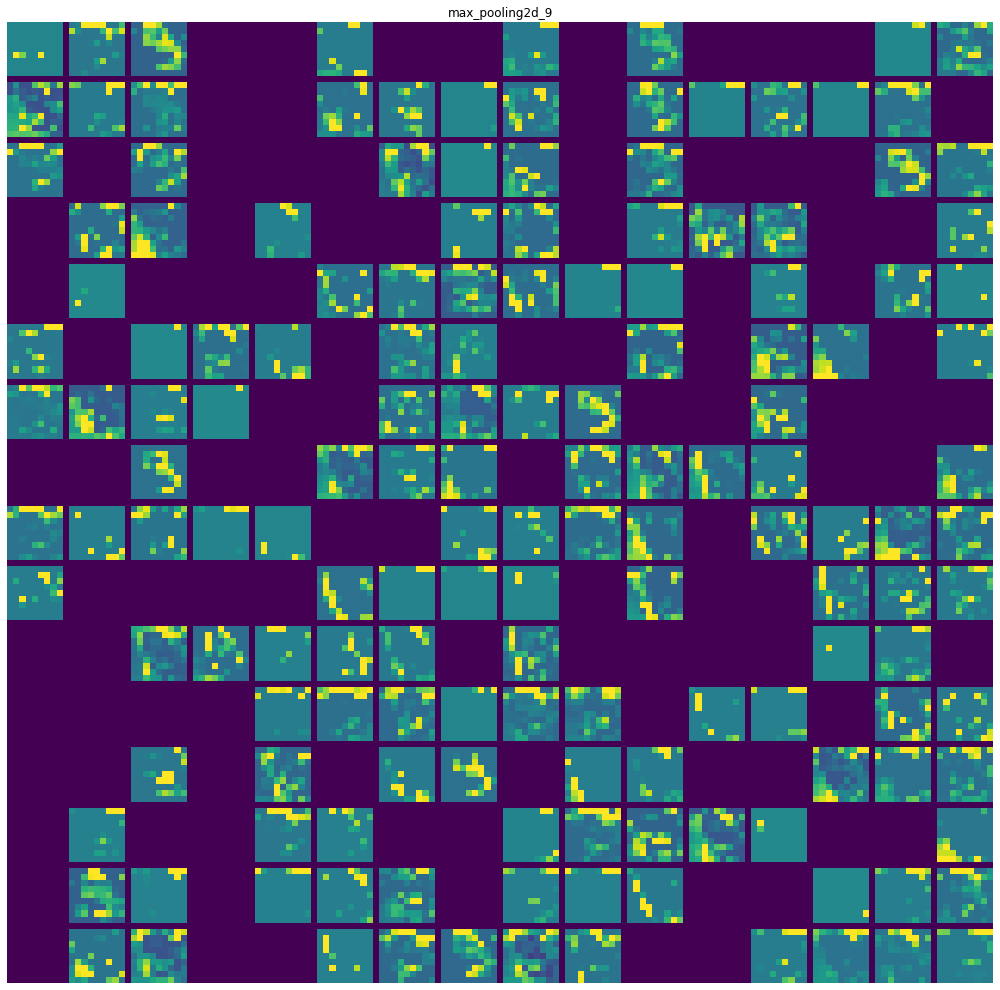

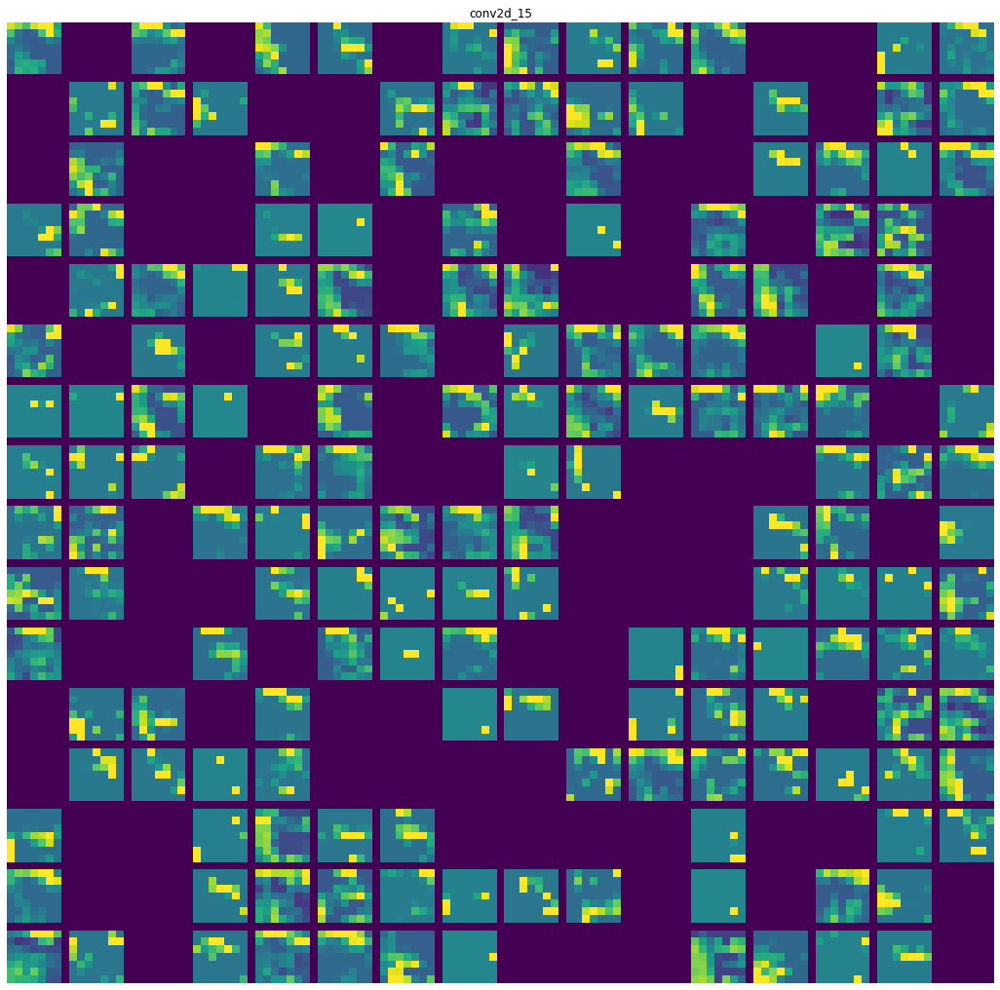

In [17]:
images_per_row = 16
for layer_name, layer_activation in zip(layer_names, activations):
    # 一共有多少个特征
    n_features = layer_activation.shape[-1]
    # 得到宽和高
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros(((size + 1) * n_cols - 1,
                                 images_per_row * (size + 1) - 1))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_index = col * images_per_row + row
            channel_image = layer_activation[0, :, :, channel_index].copy()
            # 规范化图像到 [0, 255]
            if channel_image.sum() != 0: 
                # (x - mean) / std  
                channel_image -= channel_image.mean() 
                channel_image /= channel_image.std() 
                # ?
                channel_image *= 64
                channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype("uint8") 
            display_grid[
                col * (size + 1): (col + 1) * size + col,
                row * (size + 1) : (row + 1) * size + row] = channel_image
            
    scale = 1. / size
    plt.figure(figsize = (scale * display_grid.shape[1],
                          scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.axis("off")
    plt.imshow(display_grid, aspect="auto", cmap="viridis")

这里有几件事需要注意：
- 第一层是各种边缘检测器的集合。在那个阶段，激活保留了初始图片中几乎所有的信息。
- 随着你走得更深，激活变得越来越抽象，视觉上越来越少可解释的。他们开始编码更高级别的概念，如“猫耳朵”和“猫眼”。关于图像视觉内容的信息越来越少，与图像类别相关的信息越来越多。
- 激活的稀疏性随着层的深度而增加：在第一层中，几乎所有 filter 都由输入图像激活，但在以下层中，越来越多的 filter 是空白的。这意味着在输入图像中找不到由 filter 编码的模式。

我们刚刚证明了深层神经网络学到的表示的一个重要普遍特征：一层提取的特征随着层的深度而变得越来越抽象。更高层的激活携带的关于所看到的具体输入的信息越来越少，关于目标的信息越来越多（在这种情况下，图像的类别：猫或狗）。深度神经网络有效地充当信息蒸馏管道，原始数据进入（在这种情况下是RGB图片）并被反复转换，以便过滤掉无关的信息（例如，图像的特定视觉外观），有用的信息被放大和细化（例如，图像的类别）。

这类似于人类和动物感知世界的方式：在观察场景几秒钟后，人类可以记住其中存在哪些抽象物体（自行车、树），但无法记住这些物体的具体外观。事实上，即使你一生中见过数千辆自行车， 你也只能从记忆中画出一辆通用的自行车（例如，见图9.15）。

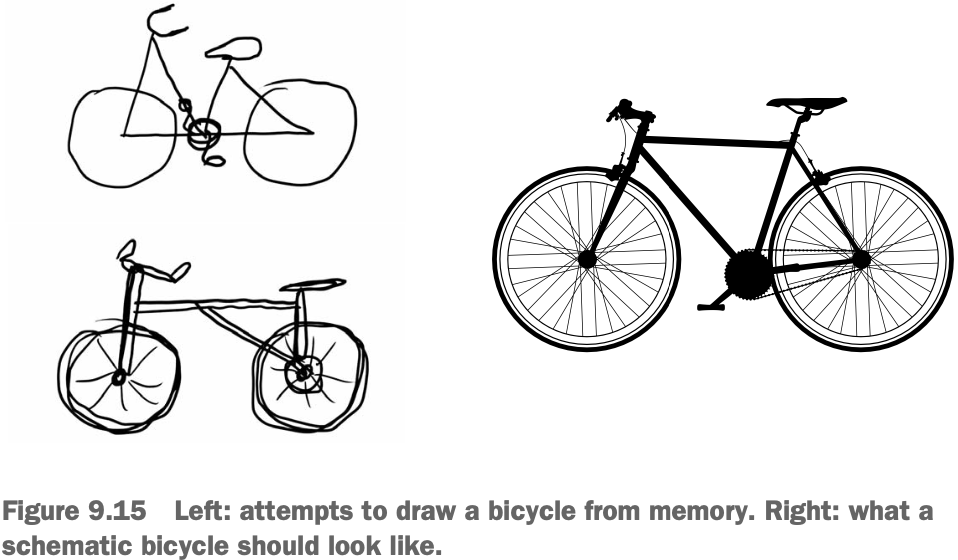

你的大脑已经学会了完全抽象其视觉输入 —— 将其转换为高级视觉概念， 并且滤除无关的视觉信息 —— 使你很难记住你周围的东西是什么样子。

### 9.4.2 Visualizing convnet filters

检查 convnets 学到的 filter 的另一种简单方法是显示每个 filter 要响应的视觉图案。这可以通过输入空间中的梯度上升来实现：将梯度下降应用于convnet的输入图像的值，以便从空白输入图像开始，最大化特定 filter 的响应。生成的输入图像将是所选过滤器最大响应的图像。

让我们用在 ImageNet 上预训练的 Xception 模型的 filter 来尝试一下。这个过程很简单：我们将构建一个损失函数，使给定 filter 在给定卷积层中的值最大化，然后我们将使用随机梯度下降来调整输入图像的值，以最大化该激活值。这将是我们利用 `GradientTape` 对象的低级梯度下降循环的第二个例子（第一个例子是第2章）。

首先，让我们实例化 `Xception` 模型，该模型加载了在 ImageNet 数据集上预训练的权重。

In [18]:
model = keras.applications.xception.Xception(
    weights="imagenet",
    include_top=False)

83697664/83683744 [==============================] - 315s 4us/step


我们对模型的卷积层感兴趣 —— `Conv2D` 和 `SeparableConv2D` 层。我们需要知道他们的名字，这样我们才能检索他们的输出。让我们按顺序打印他们的名字。

In [19]:
for layer in model.layers:
    if isinstance(layer, (keras.layers.Conv2D, keras.layers.SeparableConv2D)):
        print(layer.name)

block1_conv1
block1_conv2
block2_sepconv1
block2_sepconv2
conv2d
block3_sepconv1
block3_sepconv2
conv2d_1
block4_sepconv1
block4_sepconv2
conv2d_2
block5_sepconv1
block5_sepconv2
block5_sepconv3
block6_sepconv1
block6_sepconv2
block6_sepconv3
block7_sepconv1
block7_sepconv2
block7_sepconv3
block8_sepconv1
block8_sepconv2
block8_sepconv3
block9_sepconv1
block9_sepconv2
block9_sepconv3
block10_sepconv1
block10_sepconv2
block10_sepconv3
block11_sepconv1
block11_sepconv2
block11_sepconv3
block12_sepconv1
block12_sepconv2
block12_sepconv3
block13_sepconv1
block13_sepconv2
conv2d_3
block14_sepconv1
block14_sepconv2


您会注意到，这里的 `SeparableConv2D` 层都命名为 `block6_sepconv1`、`block7_sepconv2`等。Xception 结构为块，每个块包含几个卷积层。

现在，让我们创建第二个返回特定层输出的模型——特征提取器模型。由于我们的模型是一个 Functional API模型，因此它是可检查的：我们可以查询其一个层的输出，并在新模型中重用。无需复制整个Xception代码。

In [20]:
layer_name = "block3_sepconv1"
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.input, outputs=layer.output)

要使用此模型，只需在某些输入数据上调用它（请注意，Xception需要通过`keras.applications.xception.preprocess_input` 函数预处理输入）。

In [21]:
activation = feature_extractor( 
    keras.applications.xception.preprocess_input(img_tensor)
)

让我们使用我们的特征提取器模型来定义一个函数，该函数返回一个标量值，该值量化给定输入图像在层中“激活”给定过滤器的程度。这是我们将在梯度上升过程中最大化的“损失函数”：

In [22]:
import tensorflow as tf

def compute_loss(image, filter_index):
    activation = feature_extractor(image)
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    return tf.reduce_mean(filter_activation)

> ** `model.predict() 和 model(x)` 的不同**
> 在上一章中，我们使用 `predict(x)` 进行特征提取。在这里，我们使用的是 `model(x)`。
>
> `Y = model.predict(x)` 和 `y = model(x)` (其中x是输入数据数组) 都意味着 “在x上运行模型并检索输出y”。然而，它们并不完全相同。
>
>  `predict()` 在批量中循环数据（事实上，您可以通过 `predcit(x，batch_size=64)` 指定批处理大小），并提取输出的NumPy值。这在原理上等同于这一点：
> ```
> def predict(x): 
    y_batches = []
    for x_batch in get_batches(x):
        y_batch = model(x).numpy()
        y_batches.append(y_batch) 
    return np.concatenate(y_batches)
> ```
> 
> 这意味着 `predict()` 调用可以扩展到非常大的数组。同时，`model(x)` 发生在内存中，不会缩放。另一方面， `predict()` 不可微：如果您在 `GradientTape` 作用域中调用它，则无法检索其梯度。
>
> 当您需要检索模型调用的梯度时，您应该使用 `model(x)`，如果您只需要输出值，则应使用 `predict()`。换句话说，除非您正在编写低级梯度下降循环（就像我们现在一样），否则请始终使用 `predict()`。

让我们使用 `GradientTape` 设置梯度上升步骤函数。请注意，我们将使用 `@tf.function` 装饰器来加快速度。

帮助梯度下降过程顺利进行的一个不明显的技巧是将梯度张量除以其L2范数（the square root of the average of the square of the values in the tensor）来使其归一化。这确保了对输入图像所做的更新大小始终在同一范围内。

In [23]:
@tf.function
def gradient_ascent_step(image, filter_index, learning_rate): 
    with tf.GradientTape() as tape:
        tape.watch(image)
        loss = compute_loss(image, filter_index)
    grads = tape.gradient(loss, image)
    grads = tf.math.l2_normalize(grads)
    image += learning_rate * grads
    return image

现在我们有了所有的碎片。让我们把它们放在一个Python函数中，该函数将层名称和 filter 索引作为输入，并返回一个张量，表示最大化指定 filter 激活的模式。

In [24]:
img_width = 200
img_height = 200

def generate_filter_pattern(filter_index):
    iterations = 30
    learning_rate = 10.
    image = tf.random.uniform(
        minval=0.4,
        maxval=0.6,
        shape=(1, img_width, img_height, 3))
    for i in range(iterations):
        image = gradient_ascent_step(image, filter_index, learning_rate)
    return image[0].numpy()

由此产生的图像张量是一个形状的浮点数组 `(200，200，3)`，其值可能不是 `[0,255]` 内的整数。因此，我们需要对这十个张量进行后处理，才能将其变成可显示的图像。我们使用以下函数来做到这一点。

In [25]:
def deprocess_image(image): 
    image -= image.mean() 
    image /= image.std() 
    image *= 64
    image += 128
    image = np.clip(image, 0, 255).astype("uint8")
    image = image[25:-25, 25:-25, :] 
    return image

2022-04-07 17:20:52.050909: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


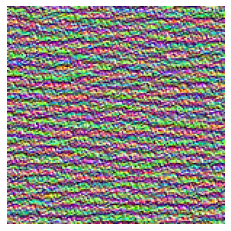

In [26]:
plt.axis("off")
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=2)))

似乎 `block3_sepconv1` 层中的 filter 0 对水平线模式有响应，有点像水或毛皮。

现在有趣的部分：您可以开始可视化该层中的每个 filter，甚至模型中每个层中的每个 filter。

In [27]:
all_images = []
# 为前 64 个 filter 生成并保存可视化
for filter_index in range(64):
    print(f"Processing filter {filter_index}") 
    image = deprocess_image(
        generate_filter_pattern(filter_index)
    )
    all_images.append(image)

# 创建空白的 canvas 用以填充 filter 可视化 
margin = 5
n=8
cropped_width = img_width - 25 * 2 
cropped_height = img_height - 25 * 2
width = n * cropped_width + (n - 1) * margin 
height = n * cropped_height + (n - 1) * margin
stitched_filters = np.zeros((width, height, 3))

for i in range(n): 
    for j in range(n):
        row_start = (cropped_width + margin) * i
        row_end = (cropped_width + margin) * i + cropped_width 
        column_start = (cropped_height + margin) * j
        column_end = (cropped_height + margin) * j + cropped_height
        stitched_filters[
            row_start: row_end,
            column_start: column_end, :] = image
keras.utils.save_img(
    f"filters_for_layer_{layer_name}.png", stitched_filters)

Processing filter 0


2022-04-07 17:54:32.698631: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 1


2022-04-07 17:54:33.107983: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 2
Processing filter 3


2022-04-07 17:54:33.719062: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 4


2022-04-07 17:54:34.064376: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 5


2022-04-07 17:54:34.403706: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 6


2022-04-07 17:54:34.740308: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 7


2022-04-07 17:54:35.078208: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 8


2022-04-07 17:54:35.419507: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 9


2022-04-07 17:54:35.758635: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 10


2022-04-07 17:54:36.104751: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 11


2022-04-07 17:54:36.460419: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 12


2022-04-07 17:54:36.822239: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 13


2022-04-07 17:54:37.176889: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 14


2022-04-07 17:54:37.527353: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 15


2022-04-07 17:54:37.879161: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 16


2022-04-07 17:54:38.226819: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 17


2022-04-07 17:54:38.585580: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 18


2022-04-07 17:54:38.939624: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 19


2022-04-07 17:54:39.297297: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 20


2022-04-07 17:54:39.668073: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 21


2022-04-07 17:54:40.039122: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 22


2022-04-07 17:54:40.421530: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 23


2022-04-07 17:54:40.797170: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 24


2022-04-07 17:54:41.177601: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 25


2022-04-07 17:54:41.565156: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 26


2022-04-07 17:54:41.938499: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 27


2022-04-07 17:54:42.316650: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 28


2022-04-07 17:54:42.684056: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 29


2022-04-07 17:54:43.059311: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 30


2022-04-07 17:54:43.427542: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 31


2022-04-07 17:54:43.792364: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 32


2022-04-07 17:54:44.168551: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 33


2022-04-07 17:54:44.535596: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 34


2022-04-07 17:54:44.905618: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 35


2022-04-07 17:54:45.269098: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 36


2022-04-07 17:54:45.624240: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 37


2022-04-07 17:54:46.018120: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 38


2022-04-07 17:54:46.377887: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 39


2022-04-07 17:54:46.766102: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 40


2022-04-07 17:54:47.167421: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 41


2022-04-07 17:54:47.560290: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 42


2022-04-07 17:54:48.119103: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 43


2022-04-07 17:54:48.515470: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 44


2022-04-07 17:54:48.889397: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 45


2022-04-07 17:54:49.282274: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 46


2022-04-07 17:54:49.674592: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 47


2022-04-07 17:54:50.060780: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 48


2022-04-07 17:54:50.448598: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 49


2022-04-07 17:54:50.845839: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 50


2022-04-07 17:54:51.249773: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 51


2022-04-07 17:54:51.656220: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 52


2022-04-07 17:54:52.059743: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 53


2022-04-07 17:54:52.451982: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 54


2022-04-07 17:54:52.862745: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 55


2022-04-07 17:54:53.275786: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 56


2022-04-07 17:54:53.669743: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 57


2022-04-07 17:54:54.079564: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 58


2022-04-07 17:54:54.483328: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 59


2022-04-07 17:54:54.892803: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 60


2022-04-07 17:54:55.297090: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 61


2022-04-07 17:54:55.697519: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 62


2022-04-07 17:54:56.091150: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Processing filter 63


2022-04-07 17:54:56.489550: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


这些 filter 可视化（见图9.17）告诉你很多关于convnet层如何看待世界：convnet中的每个层都学习一个 filter 的集合，这样它们的输入可以表示为 filter 的组合。这类似于傅里叶变换如何将信号分解到余弦函数上。随着您深入模型的深入，这些convnet filter 库中的 filter 变得越来越复杂和精致：

- 模型中第一层的过滤器编码简单的定向边缘和颜色（在某些情况下是彩色边缘）。
- 来自 stack 底层的 filter，例如 `block4_sepconv1`，编码由边缘和颜色组合制成的简单纹理。
- 较高层的 filter 开始类似于自然图像中的纹理：羽毛、眼睛、叶子等。

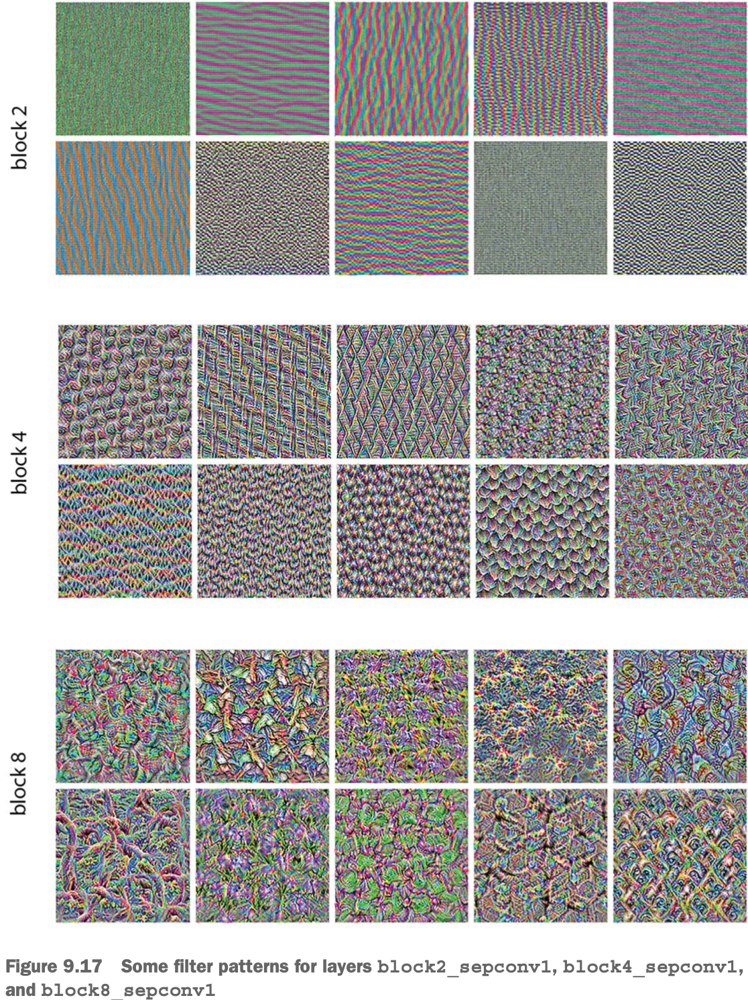


### 9.4.3 Visualizing heatmaps of class activation

我们将介绍最后一种可视化技术——该技术有助于了解给定图像的哪些部分导致convnet做出最终分类决定。这有助于“调试”convnet的决策过程，特别是在分类错误（称为模型可解释性的问题领域）的情况下。它还允许您在图像中定位特定对象。

这种一般技术类别被称为 `class activation map`(CAM) 可视化，它由对输入图像的 class activation 生成的热力图组成。class activation 热力图是与特定输出 class 相关分数的2D grid， 为输入图像中的每个位置计算，表明每个位置相对于所考虑的类有多重要。例如，给定图像 输入 狗与猫的convnet，CAM可视化将允许您为 class “猫”生成热力图，指示图像的不同部分有多像猫，以及“狗” class 的热力图，指示图像中和狗相似的部分。

我们将使用的具体实现是一篇题为“Grad-CAM：Visual Explanations from Deep Networks via Gradient-based Localization”的文章中描述的实现。

Grad-CAM 包括取卷积层的输出特征映射，给定输入图像，并通过每个通道的类的梯度加权特征图的每个通道。直觉上，理解这个技巧的一种方法是想象您正在通过“每个通道对类的重要性”来加权“输入图像对不同通道的强度”，从而生成“输入图像class activation 的强度”的空间图。

让我们使用预训练的Xception模型来演示这项技术。

In [28]:
model = keras.applications.xception.Xception(weights="imagenet")

91897856/91884032 [==============================] - 126s 1us/step


以图9.18所示的两头非洲大象的图像为例，可能是一头母象和她的孩子，在热带草原上漫步。让我们将此图像转换为Xception模型可以读取的东西：该模型是在299×299大小的图像上训练的，根据 `keras.applications.xception .preprocess_input` 函数中打包的一些规则进行预处理。因此，我们需要加载图像，将其大小调整为299×299，将其转换为 NumPy float32 张量，并应用这些预处理规则。

In [29]:
img_path = keras.utils.get_file(
    fname="elephant.jpg",
    origin="https://img-datasets.s3.amazonaws.com/elephant.jpg")

def get_img_array(img_path, target_size):
    img = keras.utils.load_img(img_path, target_size=target_size) 
    array = keras.utils.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    array = keras.applications.xception.preprocess_input(array) 
    return array

img_array = get_img_array(img_path, target_size=(299, 299))

745472/733657 [==============================] - 2s 2us/step


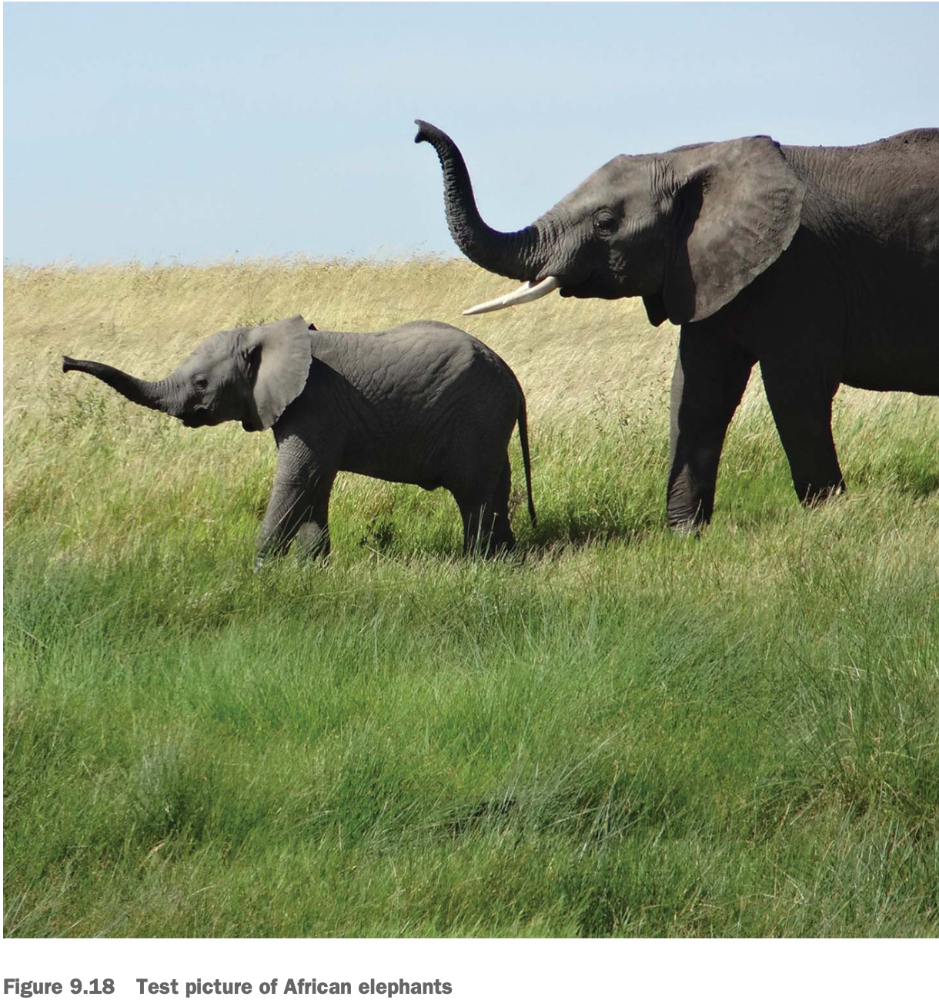

您现在可以在图像上运行预训练的网络，并将其预测向量解码为人类可读的格式：

In [30]:
preds = model.predict(img_array)
print(keras.applications.xception.decode_predictions(preds, top=3)[0])

2022-04-07 18:52:50.598656: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


49152/35363 [=========================================] - 0s 1us/step
[('n02504458', 'African_elephant', 0.8699397), ('n01871265', 'tusker', 0.076956324), ('n02504013', 'Indian_elephant', 0.023541769)]


此图像预测的前三类如下：

- African elephant (with 87% probability)
- Tusker (with 7% probability)
- Indian elephant (with 2% probability)

该网络已经认识到该图像包含数量不确定的非洲大象。预测矢量中最大激活的条目与“非洲大象”类相对应，索引为386：

In [33]:
np.argmax(preds[0])

386

要可视化图像的哪些部分最像非洲大象，让我们设置Grad-CAM流程。

首先，我们创建一个模型，将输入图像映射到最后一个卷积层的激活。

In [34]:
last_conv_layer_name = "block14_sepconv2_act"
classifier_layer_names = [
    "avg_pool",
    "predictions",
]
last_conv_layer = model.get_layer(last_conv_layer_name) 
last_conv_layer_model = keras.Model(model.inputs, last_conv_layer.output)

其次，我们创建一个模型，将最后一个卷积层的激活映射到最终的类预测。

In [36]:
classifier_input = keras.Input(shape=last_conv_layer.output.shape[1:]) 
x = classifier_input
for layer_name in classifier_layer_names:
    x = model.get_layer(layer_name)(x)
classifier_model = keras.Model(classifier_input, x)

然后，我们计算输入图像顶部预测类相对于最后一个卷积层激活的梯度。

In [37]:
import tensorflow as tf

with tf.GradientTape() as tape:
    last_conv_layer_output = last_conv_layer_model(img_array) 
    tape.watch(last_conv_layer_output)
    preds = classifier_model(last_conv_layer_output) 
    top_pred_index = tf.argmax(preds[0])
    top_class_channel = preds[:, top_pred_index]
    
grads = tape.gradient(top_class_channel, last_conv_layer_output)

现在，我们将池化和加权应用于梯度张量，以获得我们的类激活的热力图。

In [38]:
pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2)).numpy()
last_conv_layer_output = last_conv_layer_output.numpy()[0]
for i in range(pooled_grads.shape[-1]):
    last_conv_layer_output[:, :, i] *= pooled_grads[i]
heatmap = np.mean(last_conv_layer_output, axis=-1)

为了可视化，我们还将其规范为0到1之间的热力图。

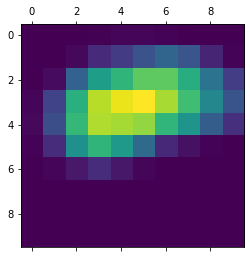

In [39]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)

最后，让我们生成一个将原始图像叠加在我们刚刚获得的热力图上的图像。

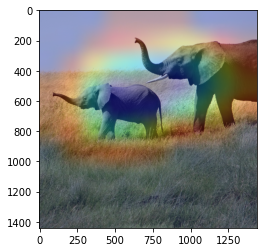

In [41]:
import matplotlib.cm as cm

img = keras.utils.load_img(img_path)
img = keras.utils.img_to_array(img)

heatmap = np.uint8(255 * heatmap)

jet = cm.get_cmap("jet")
jet_colors = jet(np.arange(256))[:, :3]
jet_heatmap = jet_colors[heatmap]

jet_heatmap = keras.utils.array_to_img(jet_heatmap) 
jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
jet_heatmap = keras.utils.img_to_array(jet_heatmap)

superimposed_img = jet_heatmap * 0.4 + img
superimposed_img = keras.utils.array_to_img(superimposed_img)

save_path = "elephant_cam.jpg"
superimposed_img.save(save_path)
plt.imshow(superimposed_img)

这种可视化技术回答了两个重要问题:
    
- 为什么网络认为这张照片包含一头非洲大象？
- 图片中的非洲大象在哪里？

特别是，值得注意的是，小象的耳朵有强烈的作用：这可能是网络区分非洲大象和印度大象的方式。

## Sumaary

- 通过深度学习，您可以完成三项基本的计算机视觉任务：图像分类、图像分割和目标检测。
- 遵循现代convnet架构最佳实践将帮助您充分利用模型。其中一些最佳实践包括使用 residual connections、batch normalization 和 depthwise separable convolutions。
- Convnets学习的表征很容易检查——convnets不是黑匣子！
- 您可以生成convnets学习的 filter 的可视化，以及 class activity 的热力图。